# **1. LIBRARIES**

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import os
import random
from PIL import Image
from collections import defaultdict
import seaborn as sns
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from tensorflow.keras.applications import Xception, VGG16, MobileNetV2
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint
from IPython.display import display, clear_output
import ipywidgets as widgets
from io import BytesIO
import zipfile
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **2. DATA PREPROCESSING**

In [ ]:
# zip_path = '/content/drive/My Drive/batikdataset.zip'
# extract_path = '/content/drive/MyDrive'

# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_path)

In [ ]:
train_dir = "/content/drive/MyDrive/batikdataset/TRAIN"
test_dir = "/content/drive/MyDrive/batikdataset/TEST"

In [ ]:
def count_images_per_label(dir_path):
    label_counts = defaultdict(int)
    for label in os.listdir(dir_path):
        label_path = os.path.join(dir_path, label)
        if os.path.isdir(label_path):
            for image_name in os.listdir(label_path):
                if image_name.endswith(('png', 'jpg', 'jpeg')):
                    label_counts[label] += 1
    return label_counts

def display_label_counts(dir_path):
    label_counts = count_images_per_label(dir_path)
    for label, count in label_counts.items():
        print(f"Label: {label}, Jumlah Gambar: {count}")

display_label_counts(train_dir)

Label: Batik Cendrawasih, Jumlah Gambar: 141
Label: Batik Insang, Jumlah Gambar: 143
Label: Batik Kawung, Jumlah Gambar: 298
Label: Batik Megamendung, Jumlah Gambar: 219
Label: Batik Parang, Jumlah Gambar: 213
Label: Batik Poleng, Jumlah Gambar: 197
Label: Batik Tambal, Jumlah Gambar: 135


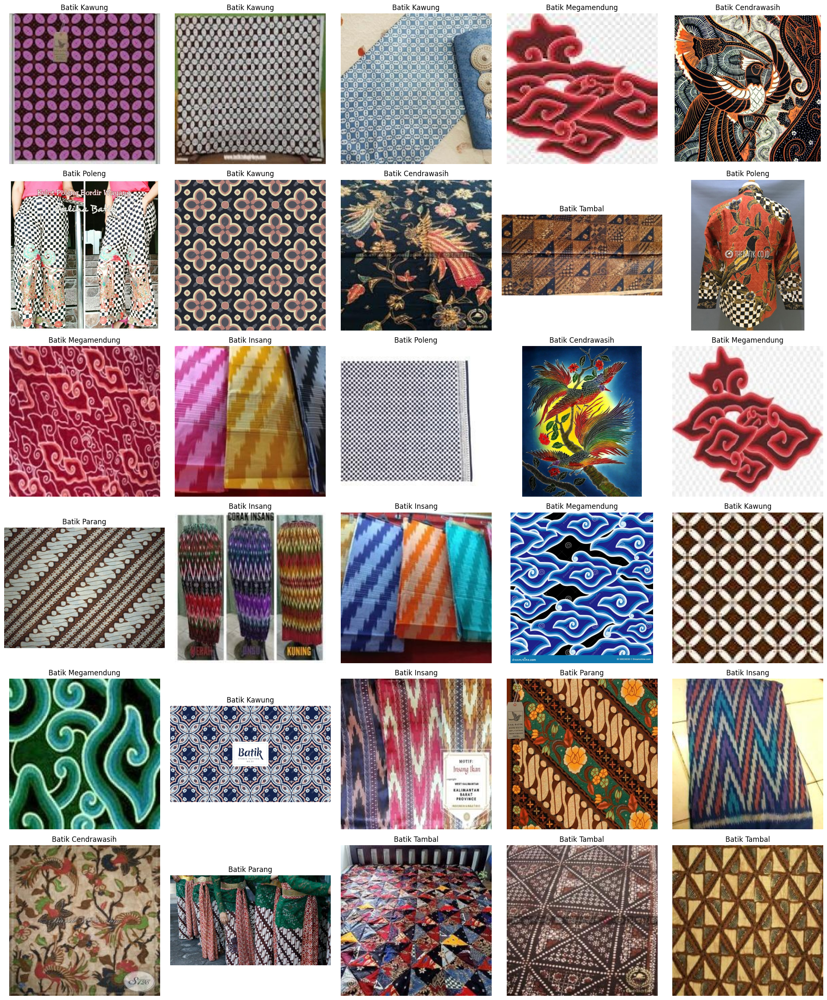

In [ ]:
def get_images_and_labels(dir_path):
    images = []
    labels = []
    for label in os.listdir(dir_path):
        label_path = os.path.join(dir_path, label)
        if os.path.isdir(label_path):
            for image_name in os.listdir(label_path):
                if image_name.endswith(('png', 'jpg', 'jpeg')):
                    images.append(os.path.join(label_path, image_name))
                    labels.append(label)
    return images, labels

def display_random_images(dir_path, num_images, images_per_row):
    images, labels = get_images_and_labels(dir_path)

    if num_images > len(images):
        print(f"Hanya ada {len(images)} gambar di direktori {dir_path}. Menampilkan semua gambar yang ada.")
        num_images = len(images)

    random_indices = random.sample(range(len(images)), num_images)
    selected_images = [images[i] for i in random_indices]
    selected_labels = [labels[i] for i in random_indices]

    num_rows = (num_images + images_per_row - 1) // images_per_row
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(images_per_row * 4, num_rows * 4))
    axes = axes.flatten()

    for img_path, label, ax in zip(selected_images, selected_labels, axes):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(label)
        ax.axis('off')

    for i in range(len(selected_images), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

display_random_images(train_dir, num_images=30, images_per_row=5)

In [ ]:
def train_val_generators(train_dir):
    train_datagen = ImageDataGenerator(rescale=1/255.0,
                                       shear_range=0.2,
                                       zoom_range=0.4,
                                       fill_mode='nearest',
                                       validation_split=0.2)

    train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                        batch_size=32,
                                                        class_mode='categorical',
                                                        target_size=(224, 224),
                                                        subset="training")

    validation_datagen = ImageDataGenerator(rescale=1/255.0,
                                            validation_split=0.2)

    validation_generator = validation_datagen.flow_from_directory(directory=train_dir,
                                                                  batch_size=32,
                                                                  class_mode='categorical',
                                                                  target_size=(224, 224),
                                                                  subset="validation")
    return train_generator, validation_generator

train_generator, validation_generator = train_val_generators(train_dir)

Found 1097 images belonging to 7 classes.
Found 271 images belonging to 7 classes.


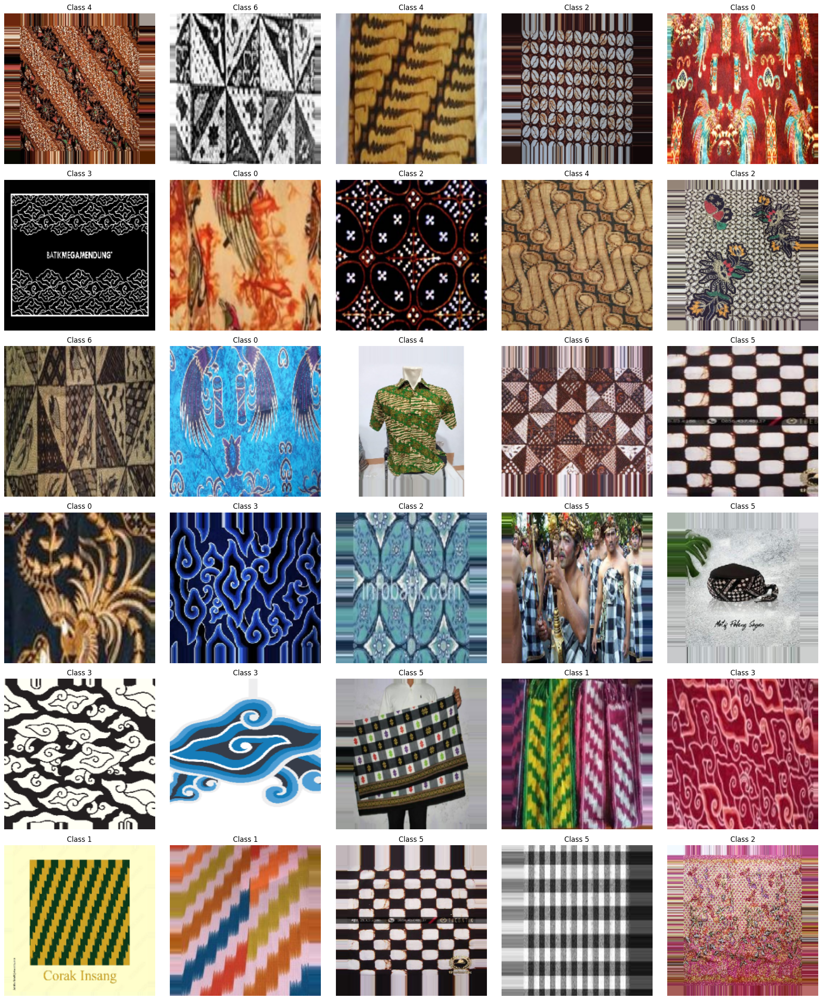

In [ ]:
def visualize_augmented_data(generator, num_images, images_per_row):
    images, labels = next(generator)

    if num_images > len(images):
        print(f"Hanya ada {len(images)} gambar dalam batch. Menampilkan semua gambar yang ada.")
        num_images = len(images)

    selected_indices = np.random.choice(len(images), num_images, replace=False)
    selected_images = [images[i] for i in selected_indices]
    selected_labels = [np.argmax(labels[i]) for i in selected_indices]

    num_rows = (num_images + images_per_row - 1) // images_per_row
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(images_per_row * 4, num_rows * 4))
    axes = axes.flatten()

    for img, label, ax in zip(selected_images, selected_labels, axes):
        ax.imshow(img)
        ax.set_title(f"Class {label}")
        ax.axis('off')

    for i in range(len(selected_images), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

visualize_augmented_data(train_generator, num_images=30, images_per_row=5)

# **3. MODEL BUILDING**

## **3.1 Xception**

In [ ]:
tf.keras.backend.clear_session()

def create_pre_trained_model():
    pre_trained_model = Xception(
        input_shape=(224, 224, 3),
        include_top=False,
        weights='imagenet',
        pooling="max"
    )

    pre_trained_model.trainable = False

    return pre_trained_model

pre_trained_model = create_pre_trained_model()

pre_trained_model.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 111, 111,  │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 111, 111,  │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 109, 109,  │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 109, 109,  │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 109, 109,  │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 109, 109,  │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 109, 109,  │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 109, 109,  │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 109, 109,  │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 109, 109,  │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 55, 55,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 55, 55,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 55, 55,    │        512 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 55, 55,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 55, 55,    │          0 │ add[0][0]       

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
tf.keras.backend.clear_session()

def create_final_model(pre_trained_model):
    inputs = Input(shape=(224, 224, 3))
    x = pre_trained_model(inputs)
    x = Dropout(0.3)(x)
    outputs = Dense(units=7, activation='softmax')(x)
    model = Model(inputs=inputs, outputs=outputs)

    model.compile(optimizer="adam",
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

model = create_final_model(pre_trained_model)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ xception (Functional)           │ (None, 2048)           │    20,861,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 7)              │        14,343 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,875,823 (79.63 MB)

 Trainable params: 14,343 (56.03 KB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
checkpoint_filepath = '/content/drive/MyDrive/checkpoint.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    callbacks=[model_checkpoint_callback]
)

Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 2/35 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.0781 - loss: 2.7964  

I0000 00:00:1717078880.283528     124 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1717078880.325360     124 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 679ms/step - accuracy: 0.2810 - loss: 2.1636

W0000 00:00:1717078906.774445     125 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


35/35 ━━━━━━━━━━━━━━━━━━━━ 53s 956ms/step - accuracy: 0.2852 - loss: 2.1500 - val_accuracy: 0.6716 - val_loss: 0.9852
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 20s 466ms/step - accuracy: 0.6728 - loss: 0.9363 - val_accuracy: 0.7306 - val_loss: 0.8331
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 20s 452ms/step - accuracy: 0.7283 - loss: 0.8100 - val_accuracy: 0.7675 - val_loss: 0.7082
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 21s 477ms/step - accuracy: 0.7476 - loss: 0.6923 - val_accuracy: 0.7712 - val_loss: 0.7139
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 20s 457ms/step - accuracy: 0.7896 - loss: 0.6431 - val_accuracy: 0.7712 - val_loss: 0.6845
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 20s 473ms/step - accuracy: 0.8038 - loss: 0.5419 - val_accuracy: 0.8155 - val_loss: 0.6500
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 20s 465ms/step - accuracy: 0.8370 - loss: 0.4699 - val_accuracy: 0.8303 - val_loss: 0.6144
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 20s 443ms/step - accuracy: 0.8147 - loss: 0.5275 - val_accuracy: 0.815

In [ ]:
model.load_weights(checkpoint_filepath)

model.save('/content/drive/MyDrive/model_xception.h5')

ValueError: Unable to synchronously create dataset (name already exists)

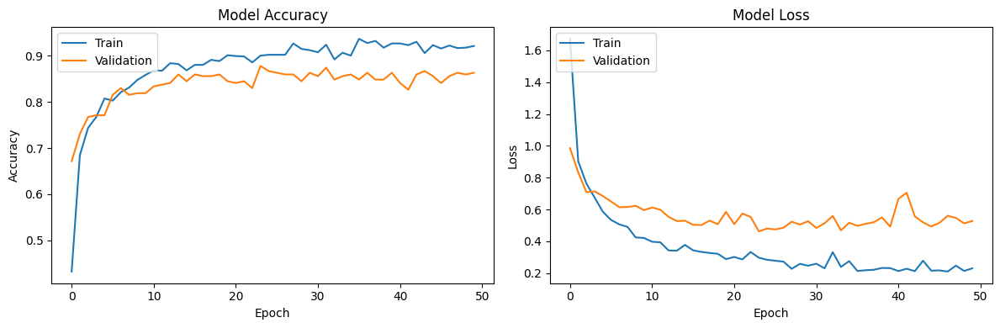

In [ ]:
def plot_training_history(history):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()
    plt.show()

plot_training_history(history)

# **4. MODEL EVALUATION**

## **4.1 Xception**

In [ ]:
model.load_weights(checkpoint_filepath)

test_datagen = ImageDataGenerator(rescale=1/255.0)
test_generator = test_datagen.flow_from_directory(directory=test_dir,
                                                  batch_size=32,
                                                  class_mode='categorical',
                                                  target_size=(224, 224),
                                                  shuffle=False)

predictions = model.predict(test_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())


report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

Found 140 images belonging to 7 classes.
5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step 
                   precision    recall  f1-score   support

Batik Cendrawasih       0.94      0.85      0.89        20
     Batik Insang       0.95      0.95      0.95        20
     Batik Kawung       1.00      0.95      0.97        20
Batik Megamendung       0.95      0.95      0.95        20
     Batik Parang       0.82      0.90      0.86        20
     Batik Poleng       0.86      0.95      0.90        20
     Batik Tambal       0.95      0.90      0.92        20

         accuracy                           0.92       140
        macro avg       0.92      0.92      0.92       140
     weighted avg       0.92      0.92      0.92       140



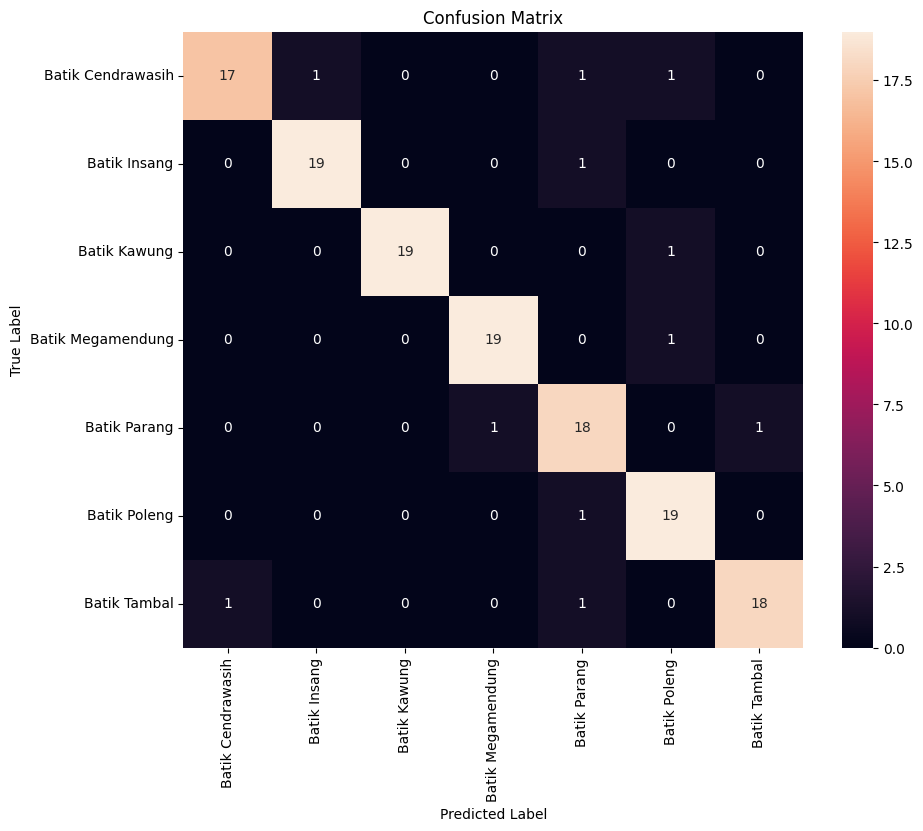

In [ ]:
conf_matrix = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# **5. MODEL PREDICTION**

In [ ]:
def create_pre_trained_model():
    pre_trained_model = Xception(
        input_shape=(224, 224, 3),
        include_top=False,
        weights='imagenet',
        pooling="max"
    )

    pre_trained_model.trainable = False

    return pre_trained_model

pre_trained_model = create_pre_trained_model()

def create_final_model(pre_trained_model):
    inputs = Input(shape=(224, 224, 3))
    x = pre_trained_model(inputs)
    x = Dropout(0.3)(x)
    outputs = Dense(units=7, activation='softmax')(x)
    model = Model(inputs=inputs, outputs=outputs)

    model.compile(optimizer="adam",
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

model = create_final_model(pre_trained_model)

checkpoint_filepath = '/content/drive/MyDrive/checkpoint.weights.h5'
model.load_weights(checkpoint_filepath)

83683744/83683744 [==============================] - 1s 0us/step


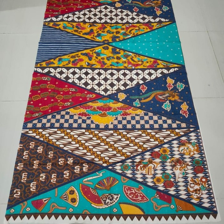

1/1 [==============================] - 0s 22ms/step
Predicted Label: Batik Tambal
Predicted Probabilities:
Batik Tambal: 0.99
Batik Insang: 0.00
Batik Poleng: 0.00
Batik Cendrawasih: 0.00
Batik Kawung: 0.00
Batik Parang: 0.00
Batik Megamendung: 0.00


FileUpload(value={}, accept='image/*', description='Upload', multiple=True)

In [ ]:
# Get class labels
class_labels = sorted(os.listdir(train_dir))

# Define average thresholds for each class
average_thresholds = {
    "Batik Insang": 0.84,
    "Batik Cendrawasih": 0.78,
    "Batik Kawung": 0.86,
    "Batik Megamendung": 0.91,
    "Batik Parang": 0.83,
    "Batik Poleng": 0.84,
    "Batik Tambal": 0.89
}

# Define the prediction function
def predict_image(image):
    img = Image.open(BytesIO(image)).resize((224, 224))
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_probabilities = predictions[0]

    return predicted_probabilities

# Define the function to handle image upload and prediction
def on_upload_change(change):
    clear_output()
    for name, file_info in change['new'].items():
        img = file_info['content']
        display(Image.open(BytesIO(img)).resize((224, 224)))

        predicted_probabilities = predict_image(img)

        # Sort the probabilities in descending order
        sorted_indices = np.argsort(predicted_probabilities)[::-1]
        sorted_probabilities = predicted_probabilities[sorted_indices]
        sorted_labels = [class_labels[i] for i in sorted_indices]

        # Determine if the prediction is recognized or unrecognized
        is_recognized = False
        for label, prob in zip(sorted_labels, sorted_probabilities):
            if prob >= average_thresholds[label]:
                is_recognized = True
                break

        if is_recognized:
            print(f"Predicted Label: {sorted_labels[0]}")
            print("Predicted Probabilities:")
            for label, prob in zip(sorted_labels, sorted_probabilities):
                print(f"{label}: {prob:.2f}")
        else:
            print("Unrecognized")

    # Recreate the uploader widget
    uploader = widgets.FileUpload(accept='image/*', multiple=True)
    uploader.observe(on_upload_change, names='value')
    display(uploader)

# Create the initial uploader widget
uploader = widgets.FileUpload(accept='image/*', multiple=True)
uploader.observe(on_upload_change, names='value')

display(uploader)